#<b><font color="purple"> Importing data, parsing, visualising, filtering. PCA :</font></b>

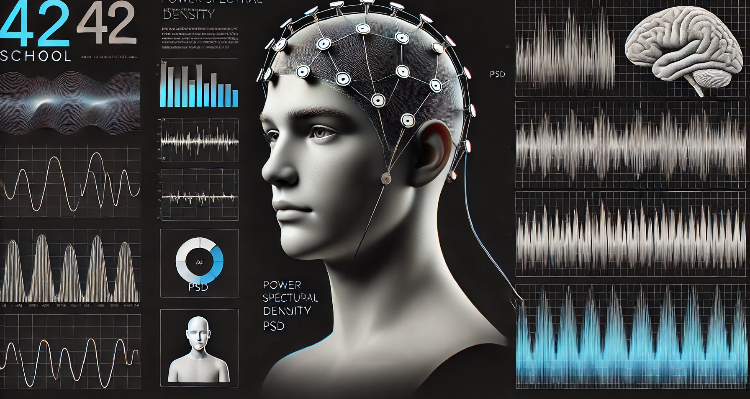

##<b><font color="blue">Project info</font></b>
* EEG data from 109 subjects. The dataset includes 6 experiments, detailed information is available [here](https://physionet.org/content/eegmmidb/1.0.0/).

### ***Experiments Overview***

| **Experiment**  | **Duration** | **Condition**          | **Events**                  | **Runs per Subject** |
|-----------------|--------------|------------------------|-----------------------------|----------------------|
| **baseline01** Run [1]  | 60 seconds   | Eyes open              | 1 event (T0 at the start)   | 1                    |
| **baseline02** Run [2]  | 60 seconds   | Eyes closed            | 1 event (T1 at the start)   | 1                    |

### ***Task-Based Experiments***

Each subject repeats the following tasks three times, totaling 12 runs (plus the 2 baseline runs), making it 14 runs per subject.

| **Task**  | **Duration** | **Events**                                                                                             |
|-----------|--------------|--------------------------------------------------------------------------------------------------------|
| **Task01** Runs [3, 7, 11]| 120 seconds  | 3 events: T0 rest (4 sec), T1 open/close left fist (4 sec), T2 open/close right fist (4 sec)           |
| **Task02** Runs [4, 8, 12]| 120 seconds  | 3 events: T0 rest (4 sec), T1 imagine open/close left fist (4 sec), T2 imagine open/close right fist (4 sec) |
| **Task03** Runs [5, 9, 13]| 120 seconds  | 3 events: T0 rest (4 sec), T1 open/close both fists (4 sec), T2 open/close both feet (4 sec)           |
| **Task04** Runs [6, 10, 14]| 120 seconds  | 3 events: T0 rest (4 sec), T1 imagine open/close both fists (4 sec), T2 imagine open/close both feet (4 sec) |


##<b><font color="blue">Importing Libraries: specialised library [mne](https://mne.tools/stable/index.html)</font></b>

In [6]:
!pip install mne

Looking in indexes: https://pypi.python.org/simple


In [7]:
import mne
from mne.io import concatenate_raws, read_raw_edf
from mne.datasets import eegbci
from mne.preprocessing import ICA

import matplotlib.pyplot as plt
import numpy as np
from time import time
import pandas as pd
from typing import List

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

##<b><font color="blue">Functions for prepocessing eeg data</font></b>

In [8]:
def rename_channels(raw) -> None:
    """
    Rename channels in an MNE raw object to match the standard 1005 montage.

    Parameters:
        raw: The MNE raw object containing EEG data. The channels in this object will be renamed according to the standard 1005 montage.

    Returns:
        None: The function modifies the `raw` object in place and does not return anything.
    """
    mapping = {
        'Fc5.': 'FC5', 'Fc3.': 'FC3', 'Fc1.': 'FC1', 'Fcz.': 'FCz', 'Fc2.': 'FC2', 'Fc4.': 'FC4', 'Fc6.': 'FC6',
        'C5..': 'C5', 'C3..': 'C3', 'C1..': 'C1', 'Cz..': 'Cz', 'C2..': 'C2', 'C4..': 'C4', 'C6..': 'C6',
        'Cp5.': 'CP5', 'Cp3.': 'CP3', 'Cp1.': 'CP1', 'Cpz.': 'CPz', 'Cp2.': 'CP2', 'Cp4.': 'CP4', 'Cp6.': 'CP6',
        'Fp1.': 'Fp1', 'Fpz.': 'Fpz', 'Fp2.': 'Fp2', 'Af7.': 'AF7', 'Af3.': 'AF3', 'Afz.': 'AFz', 'Af4.': 'AF4', 'Af8.': 'AF8',
        'F7..': 'F7', 'F5..': 'F5', 'F3..': 'F3', 'F1..': 'F1', 'Fz..': 'Fz', 'F2..': 'F2', 'F4..': 'F4', 'F6..': 'F6', 'F8..': 'F8',
        'Ft7.': 'FT7', 'Ft8.': 'FT8', 'T7..': 'T7', 'T8..': 'T8', 'T9..': 'T9', 'T10.': 'T10', 'Tp7.': 'TP7', 'Tp8.': 'TP8',
        'P7..': 'P7', 'P5..': 'P5', 'P3..': 'P3', 'P1..': 'P1', 'Pz..': 'Pz', 'P2..': 'P2', 'P4..': 'P4', 'P6..': 'P6', 'P8..': 'P8',
        'Po7.': 'PO7', 'Po3.': 'PO3', 'Poz.': 'POz', 'Po4.': 'PO4', 'Po8.': 'PO8', 'O1..': 'O1', 'Oz..': 'Oz', 'O2..': 'O2', 'Iz..': 'Iz'
    }
    raw.rename_channels(mapping)

In [9]:
def load_and_preprocess_data(subjects: List[int], runs: List[int]):
    """
    Load and preprocess EEG data for given subjects and runs.

    Parameters:
        subjects (List[int]): A list of integers representing the subject IDs whose data will be loaded.
        runs (List[int]): A list of integers representing the run IDs corresponding to the EEG experiments.

    Returns:
        raw: A concatenated MNE raw object containing the preprocessed EEG data for all specified subjects and runs.
    """
    all_raws = []
    for subject in subjects:
        # Load data for the given subject and runs
        raw_fnames = eegbci.load_data(subject, runs)
        raws = [read_raw_edf(f, preload=True) for f in raw_fnames]
        raw = concatenate_raws(raws)

        # Rename channels to match the standard montage
        rename_channels(raw)

        all_raws.append(raw)

    # Concatenate all raw data from different subjects
    raw = concatenate_raws(all_raws)

    return raw


In [12]:
def run_ica(raw, method: str, picks: list[int], fit_params: dict = None):
    """
    Run ICA on raw EEG data to remove artifacts such as eye blinks.

    Parameters:
        raw : The raw EEG data to be processed.
        method (str): The ICA method to use ('fastica', 'infomax', etc.).
        picks (list[int]): List of channel indices to apply ICA to.
        fit_params (dict, optional): Additional parameters for ICA fitting.

    Returns:
        raw_corrected: The raw data after ICA correction, with artifacts removed.
    """
    raw_corrected = raw.copy()
    n_components = 20  # Number of ICA components to use

    # Initialize the ICA object with the specified method and parameters
    ica = ICA(n_components=n_components, method=method, fit_params=fit_params, random_state=42)

    # Fit the ICA model to the raw data
    t0 = time()  # Start timing the fitting process
    ica.fit(raw_corrected, picks=picks)  # Use the pre-selected EEG channels
    fit_time = time() - t0  # Calculate the time taken to fit the ICA model

    # Plot the ICA components
    title = 'ICA decomposition using %s (took %.1fs)' % (method, fit_time)
    ica.plot_components(title=title)
    plt.show()

    # Find EOG-related components using the 'Fpz' channel
    eog_indices, scores = ica.find_bads_eog(raw, ch_name='Fpz', threshold=1.5)

    # Plot the scores of the ICA components to identify bad components
    ica.plot_scores(scores, exclude=eog_indices)

    # Mark the identified EOG components for exclusion
    ica.exclude.extend(eog_indices)

    # Apply the ICA corrections to the raw data, excluding the bad components
    raw_corrected = ica.apply(raw_corrected, n_pca_components=n_components, exclude=ica.exclude)

    # Print the excluded components and their labels
    print(ica.exclude, ica.labels_)

    # Return the corrected raw data
    return raw_corrected


##<b><font color="blue">Importing subjects and runs: [general info](https://physionet.org/content/eegmmidb/1.0.0/)</font></b>

In [13]:
# Load and preprocess data
# we can choose runs for the same subject, or from different subjects
subjects = [1]
runs = [3]
raw = load_and_preprocess_data(subjects, runs)

Extracting EDF parameters from /home/imontero/mne_data/MNE-eegbci-data/files/eegmmidb/1.0.0/S001/S001R03.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 19999  =      0.000 ...   124.994 secs...


In [14]:
# Set montage to ensure valid channel positions
montage = mne.channels.make_standard_montage('standard_1005')
raw.set_montage(montage, on_missing='ignore')

<RawEDF | S001R03.edf, 64 x 20000 (125.0 s), ~9.8 MB, data loaded>

In [15]:
# Show the events
events, event_id = mne.events_from_annotations(raw)
print(event_id)

Used Annotations descriptions: ['T0', 'T1', 'T2']
{'T0': 1, 'T1': 2, 'T2': 3}


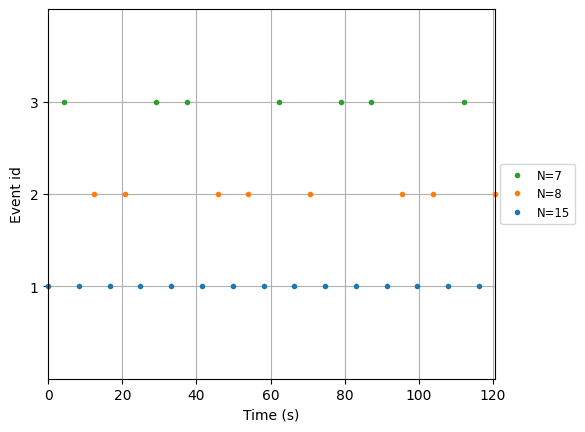

In [16]:
# Plot the events
mne.viz.plot_events(events, sfreq=raw.info['sfreq']);

In [17]:
# Select only EEG channels
picks = mne.pick_types(raw.info, meg=False, eeg=True, stim=False, eog=False, exclude='bads')
print(picks)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47
 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63]


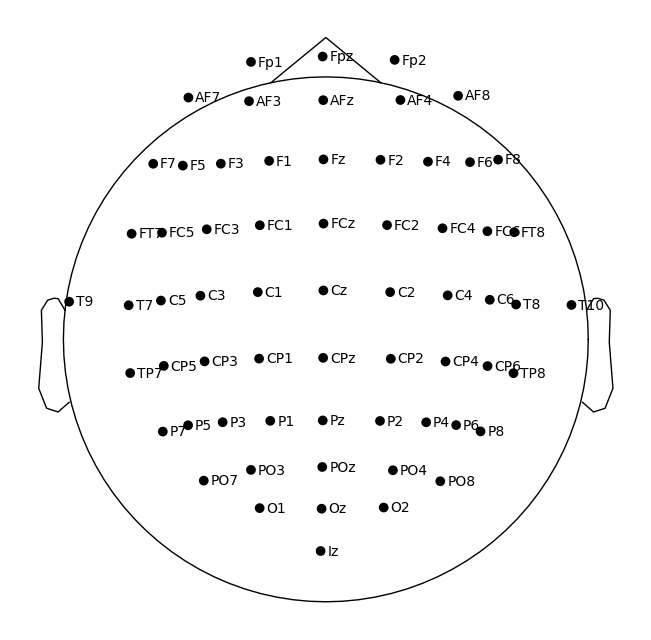

In [11]:
# Plot the topographic map
raw.plot_sensors(show_names=True, kind='topomap', ch_type='eeg');

##<b><font color="blue">raw data</font></b>

In [12]:
# chosing start and duration of the plots
start = 8
duration = 10

Using matplotlib as 2D backend.


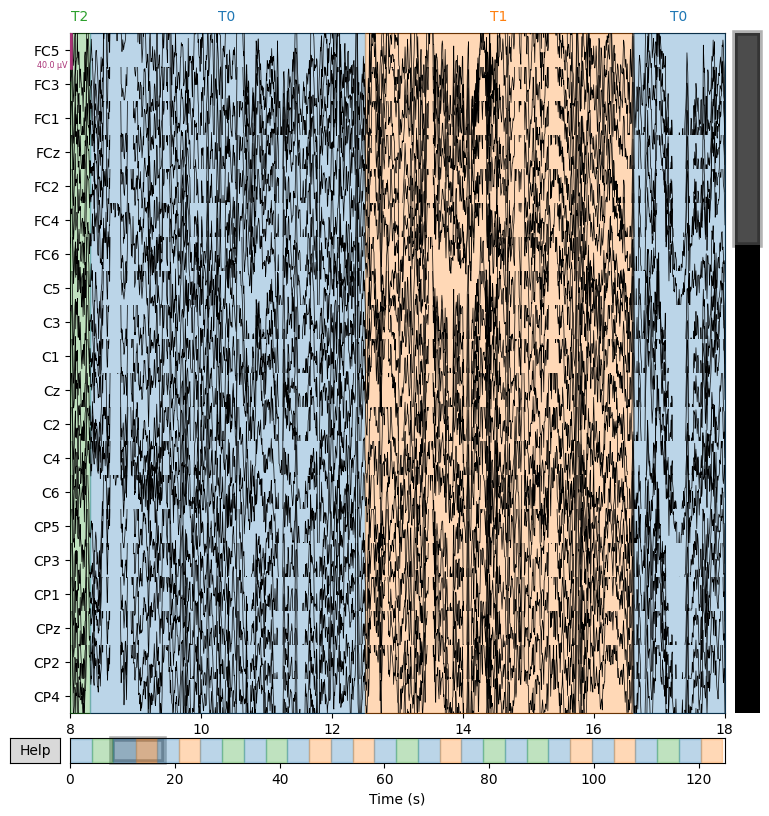

In [13]:
#time vs channels
raw.plot(picks=picks, start = start, duration = duration);

Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


<ipython-input-14-68b7f16a02fb>:3: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  psd.plot();


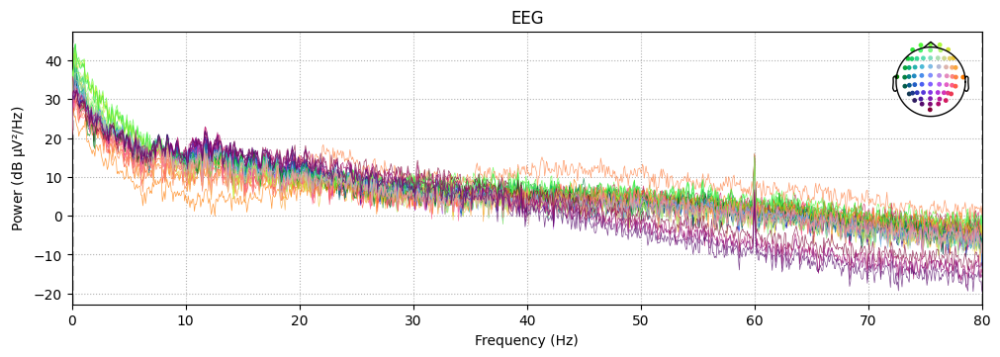

In [14]:
# Plot the Power Spectral Density (PSD) frequency - power
psd = raw.compute_psd(picks=picks, fmax=80)
psd.plot();

##<b><font color="blue">ICA on raw data - detecting possible artifacts</font></b>

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 529 samples (3.306 s)

Fitting ICA to data using 64 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 20 components
Fitting ICA took 2.0s.


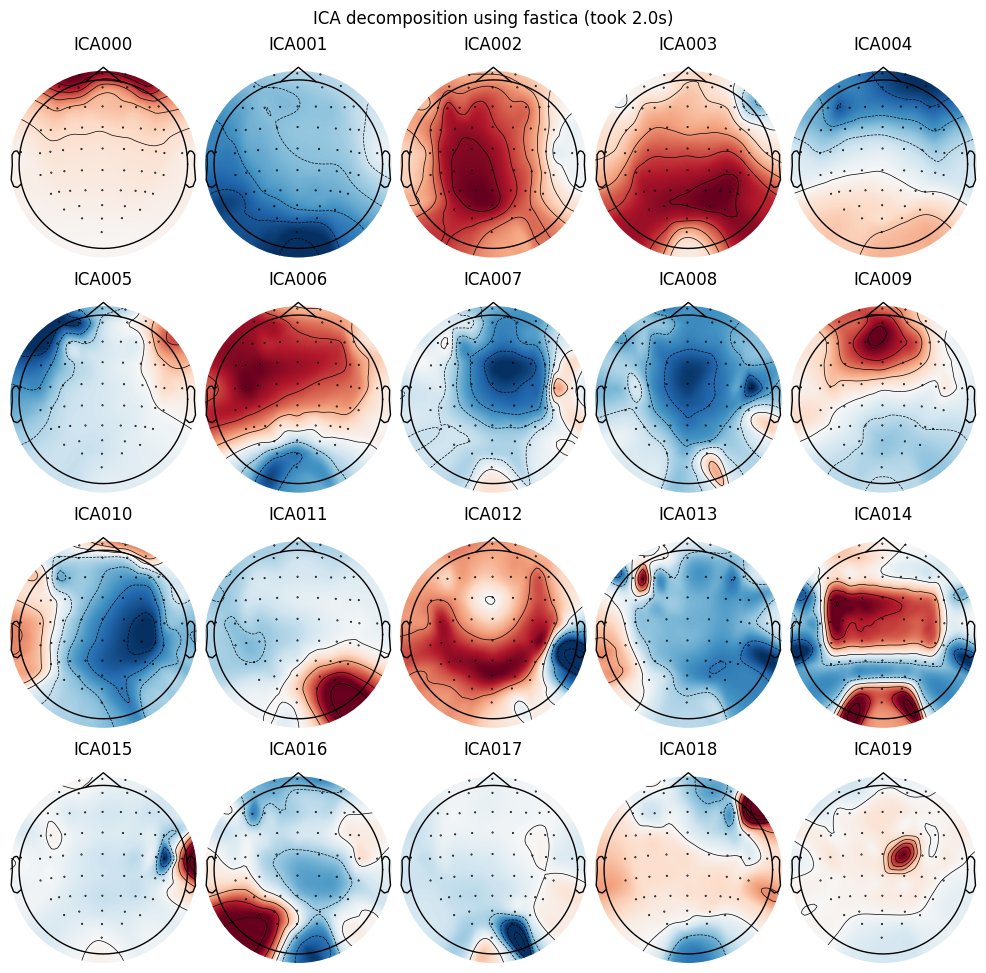

Using EOG channel: Fpz
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1600 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


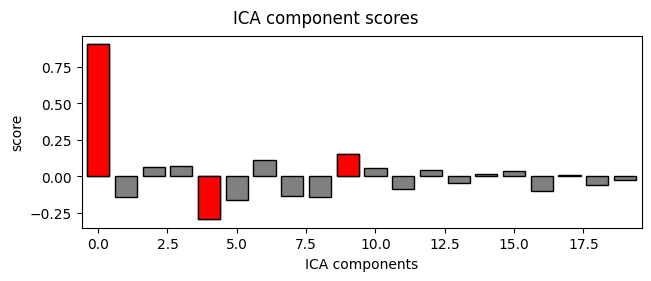

Applying ICA to Raw instance
    Transforming to ICA space (20 components)
    Zeroing out 3 ICA components
    Projecting back using 20 PCA components
[0, 4, 9] {'eog/0/Fpz': [0, 4, 9], 'eog': [0, 4, 9]}


In [15]:
# Run ICA on raw data
# Apply a high-pass filter at 1.0 Hz in place, improves ICA analysis
raw = raw.filter(l_freq=1.0, h_freq=None)
ica_raw = run_ica(raw, 'fastica', picks)

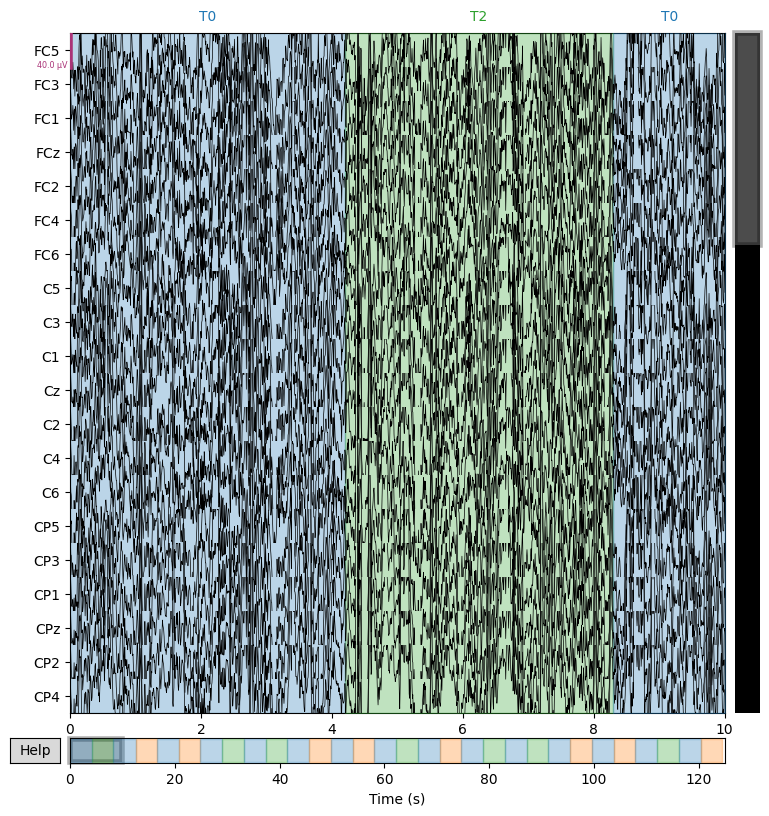

In [16]:
# Plot the raw data after ICA correction
ica_raw.plot(picks=picks);

Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


<ipython-input-17-a76e1093089e>:3: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  psd_ica_raw.plot();


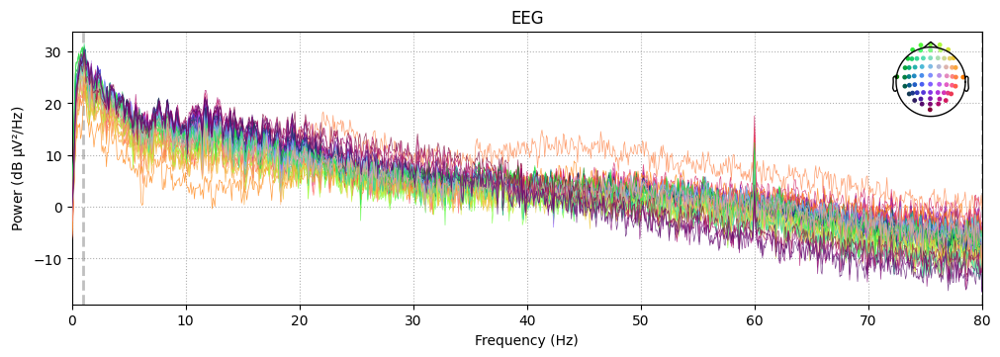

In [17]:
# Plot the Power Spectral Density (PSD) of the raw data after ICA correction
psd_ica_raw = ica_raw.compute_psd(picks=picks, fmax=80)
psd_ica_raw.plot();

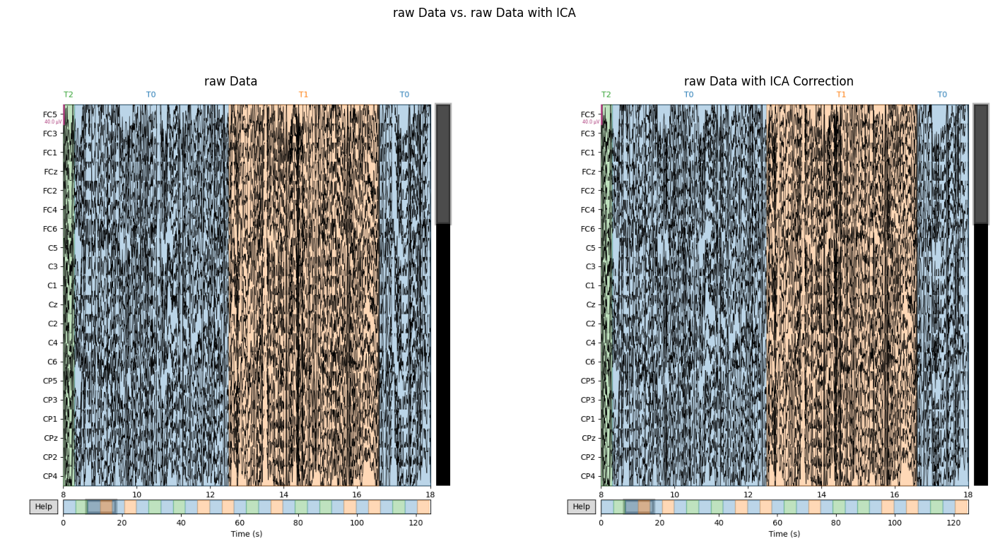

In [18]:
# Plot raw vs. raw after ICA
fig, axes = plt.subplots(1, 2, figsize=(18, 9))
fig.suptitle('raw Data vs. raw Data with ICA')

# Plot the raw data in the first subplot
raw_fig = raw.plot(picks=picks, show = False, start = start, duration = duration)
raw_fig.canvas.draw()
axes[0].imshow(raw_fig.canvas.buffer_rgba())
axes[0].set_title('raw Data')
axes[0].axis('off')
plt.close(raw_fig)

# Plot the ICA-corrected raw data in the second subplot
ica_raw_fig = ica_raw.plot(picks=picks, show = False, start = start, duration = duration)
ica_raw_fig.canvas.draw()
axes[1].imshow(ica_raw_fig.canvas.buffer_rgba())
axes[1].set_title('raw Data with ICA Correction')
axes[1].axis('off')
plt.close(ica_raw_fig)

plt.show()

##<b><font color="blue">Notch filter at 60hz, filetring 8hz - 40hz</font></b>

The human brain operates across a wide range of frequencies, with different types of brain waves associated with different states of consciousness and cognitive functions. Here are the most common brain wave frequencies:

1. **Delta Waves (0.5 - 4 Hz)**
   - **Associated States**: Deep sleep, unconsciousness
   - **Characteristics**: Delta waves are the slowest brain waves and are primarily observed during deep, restorative sleep (Stages 3 and 4 of NREM sleep). They are associated with the body's healing and regeneration processes.

2. **Theta Waves (4 - 8 Hz)**
   - **Associated States**: Light sleep, relaxation, meditation, creativity
   - **Characteristics**: Theta waves are slower than alpha waves and are typically observed during light sleep (Stage 1 and 2 of NREM sleep) and deep meditation. They are associated with creativity, intuition, and relaxation.

3. **Alpha Waves (8 - 12 Hz)**
   - **Associated States**: Relaxed wakefulness, calmness, reflection
   - **Characteristics**: Alpha waves are present during relaxed, wakeful states when the eyes are closed and the mind is calm. They are often observed during moments of quiet reflection and relaxation.

4. **Beta Waves (12 - 30 Hz)**
   - **Associated States**: Active thinking, focus, alertness, problem-solving
   - **Characteristics**: Beta waves are fast brain waves associated with active, engaged mental states such as problem-solving, decision-making, and focused attention. High levels of beta wave activity can be associated with stress and anxiety.

5. **Gamma Waves (30 - 100 Hz)**
   - **Frequency Range**: 30 to 100 Hz
   - **Associated States**: High-level cognitive functioning, information processing, learning
   - **Characteristics**: Gamma waves are the fastest brain waves and are involved in high-level cognitive functions such as perception, consciousness, information processing, and learning. They are also linked to the integration of information across different brain regions.


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 59 - 61 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 59.35
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 59.10 Hz)
- Upper passband edge: 60.65 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 60.90 Hz)
- Filter length: 1057 samples (6.606 s)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 8 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 8.00
- Lower transition bandwidth: 2.00 Hz (-6 dB cutoff frequency: 7.00 Hz)
- Upper passband edge

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


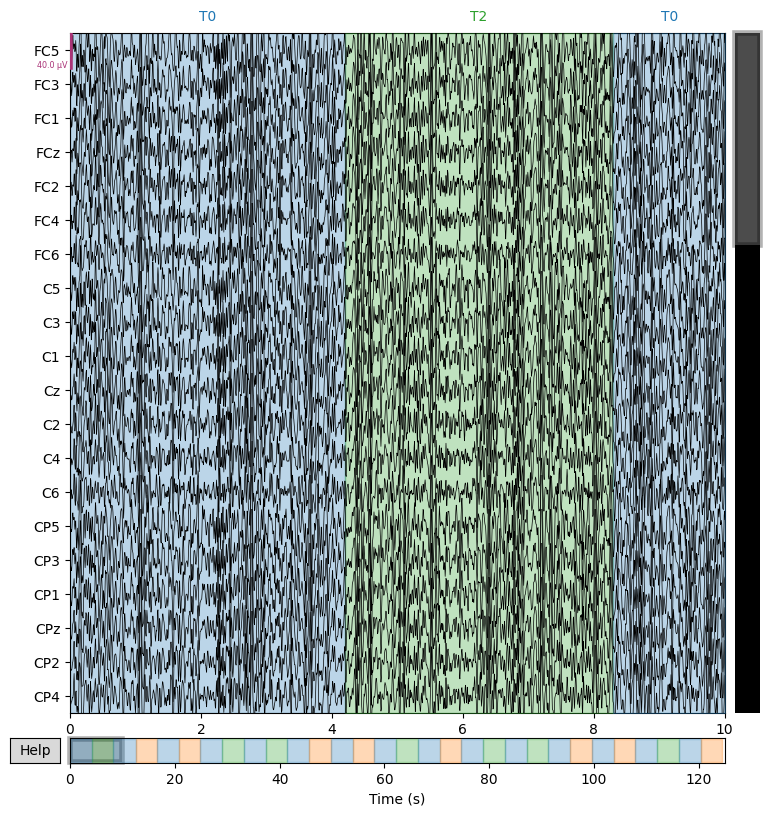

In [19]:
# Apply a notch filter at 60 Hz to the ICA-corrected data
ica_raw_notched = ica_raw.copy().notch_filter(60, picks=picks, fir_design='firwin')

# Apply a bandpass filter from 8 to 40 Hz to the ICA-corrected data
filtered_ica_raw = ica_raw_notched.copy().filter(8, 40, picks=picks, fir_design='firwin')

# Plot the filtered ICA-corrected data
filtered_ica_raw.plot(picks=picks);

Effective window size : 12.800 (s)
Plotting power spectral density (dB=True).


<ipython-input-20-5b1f9c0b894f>:3: FutureWarning: The value of `amplitude='auto'` will be removed in MNE 1.8.0, and the new default will be `amplitude=False`.
  psd_filtered_ica_raw.plot();


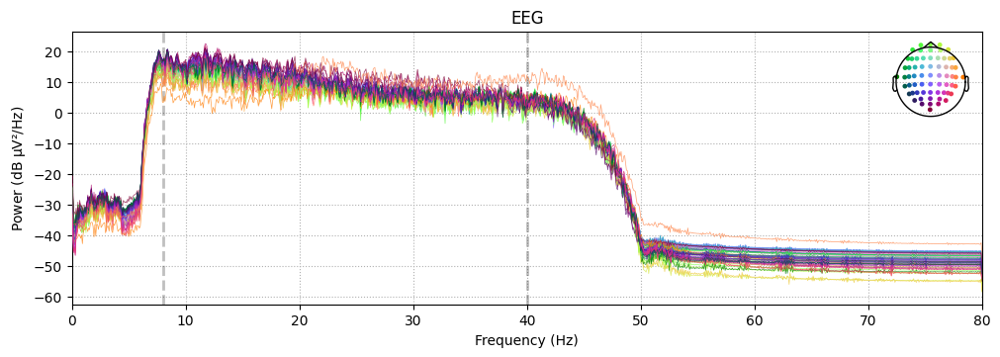

In [20]:
# Plot the Power Spectral Density (PSD) of the filtered ICA-corrected data
psd_filtered_ica_raw = filtered_ica_raw.compute_psd(picks=picks, fmax=80)
psd_filtered_ica_raw.plot();

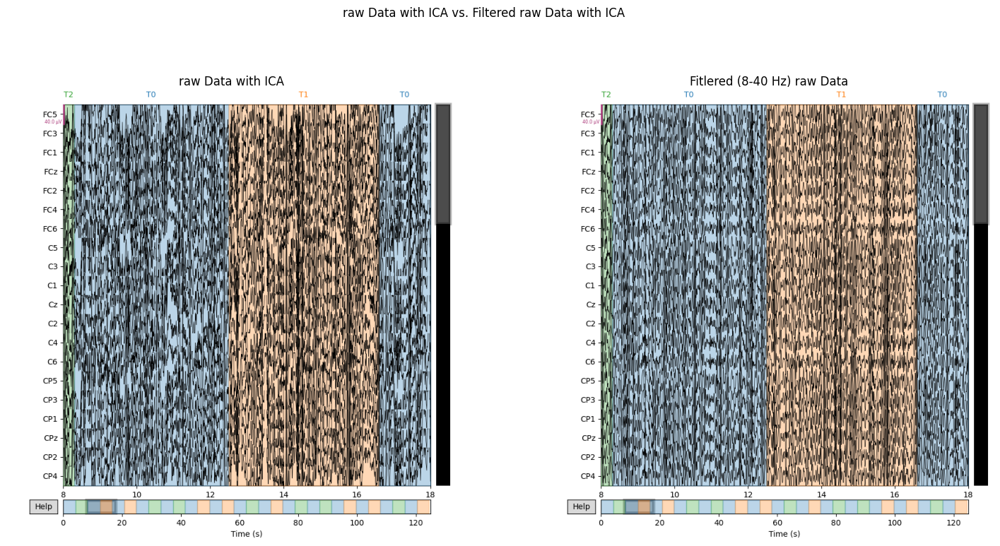

In [21]:
# Plot raw after ICA vs. filtered ICA-corrected data
fig, axes = plt.subplots(1, 2, figsize=(18, 9))
fig.suptitle('raw Data with ICA vs. Filtered raw Data with ICA')

# Plot the ICA-corrected raw data in the first subplot
ica_raw_fig = ica_raw.plot(picks=picks, show=False, start = start, duration = duration)
ica_raw_fig.canvas.draw()
axes[0].imshow(ica_raw_fig.canvas.buffer_rgba())
axes[0].set_title('raw Data with ICA')
axes[0].axis('off')
plt.close(ica_raw_fig)

# Plot the filtered ICA-corrected data in the second subplot
filtered_ica_raw_fig = filtered_ica_raw.plot(picks=picks, show=False, start = start, duration = duration)
filtered_ica_raw_fig.canvas.draw()
axes[1].imshow(filtered_ica_raw_fig.canvas.buffer_rgba())
axes[1].set_title('Fitlered (8-40 Hz) raw Data')
axes[1].axis('off')
plt.close(filtered_ica_raw_fig)

plt.show();

# <font color="blue"><b>Principal Components Analysis PCA [IBM](https://www.ibm.com/topics/principal-component-analysis)</b></font>

##Using sklearn PCA module

In [22]:
# Reshape data for PCA
data_reshaped = filtered_ica_raw.get_data().reshape(filtered_ica_raw.get_data().shape[0], -1).T

In [23]:
# Perform PCA with n = 10
pca_full = PCA(n_components=10)
pca_full.fit(data_reshaped)

PCA(n_components=10)

   Number of Components  Cumulative Explained Variance (%)
0                     1                          71.573425
1                     2                          80.135358
2                     3                          86.759509
3                     4                          89.600263
4                     5                          91.920566
5                     6                          94.008251
6                     7                          95.627264
7                     8                          96.689217
8                     9                          97.480846
9                    10                          98.076263




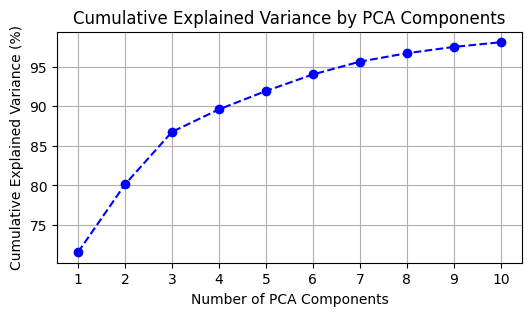

In [24]:
# Calculate the cumulative explained variance for 1 to 10 components
explained_variance_ratio = np.cumsum(pca_full.explained_variance_ratio_) * 100

# Create a DataFrame with the number of components and cumulative variance
df_explained_variance = pd.DataFrame({
    'Number of Components': range(1, len(explained_variance_ratio) + 1),
    'Cumulative Explained Variance (%)': explained_variance_ratio
})

# Display the DataFrame
print(f"{df_explained_variance}\n\n")
# Plot the explained variance ratio
plt.figure(figsize=(6, 3))
plt.plot(range(1, 11), explained_variance_ratio, marker='o', linestyle='--', color='b')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.xticks(range(1, 11))
plt.grid()
plt.show()

In [25]:
#Reshape the data
data_original = filtered_ica_raw.get_data()#to compare PCA vs original filtered statistics

In [26]:
#Apply PCA
n_components = 5  # Number of components chosen
pca = PCA(n_components=n_components)
data_pca = pca.fit_transform(data_reshaped)
# To understand how much variance is explained by the chosen components
explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_) * 100
print(f"Cumulative explained variance with {n_components} components: {explained_variance_ratio[-1]:.2f}%")

Cumulative explained variance with 5 components: 91.92%


###means of the original channels vs means of PCA reconstructed channels using n_components

In [27]:
# Transform the PCA components back to the original space
data_approx = pca.inverse_transform(data_pca)

# Reshape the data back to its original shape
data_approx_reshaped = data_approx.T.reshape(data_original.shape)

# Calculate the differences
differences = data_original - data_approx_reshaped

# Verify if the reconstructed data differs from the original
mean_difference = np.mean(np.abs(differences))

print(f"Mean absolute difference between original and reconstructed data: {mean_difference} µV")

Mean absolute difference between original and reconstructed data: 4.134999523949558e-06 µV


In [28]:
# Calculate means of original and reconstructed data, for each channel, aggregate

mean_original = np.mean(data_original, axis=1)#array
mean_reconstructed = np.mean(data_approx_reshaped, axis=1)#array

# Calculate summary statistics
mean_of_means_original = np.mean(mean_original)
mean_of_means_reconstructed = np.mean(mean_reconstructed)

print(f"Total mean(original data): {mean_of_means_original} µV\n\n")

print(f"Total mean (reconstructed data): {mean_of_means_reconstructed} µV")

Total mean(original data): -3.5926104508057717e-10 µV


Total mean (reconstructed data): -3.5926104508059734e-10 µV


In [29]:
# Create a new raw object from the reconstructed data
reconstructed_info = filtered_ica_raw.info  # Use the same info structure as the original data
reconstructed_raw = mne.io.RawArray(data_approx_reshaped, reconstructed_info)

# Add the original annotations to the new Raw object
# Extract annotations from the original raw data
annotations = filtered_ica_raw.annotations

# Set annotations to the reconstructed raw data
reconstructed_raw.set_annotations(annotations)

#original and reconstructed data for comparison
# Define picks if you have specific channels to plot, otherwise, it will plot all channels
picks = mne.pick_types(reconstructed_info, eeg=True, meg=False)

Creating RawArray with float64 data, n_channels=64, n_times=20000
    Range : 0 ... 19999 =      0.000 ...   124.994 secs
Ready.


###Comparing plots

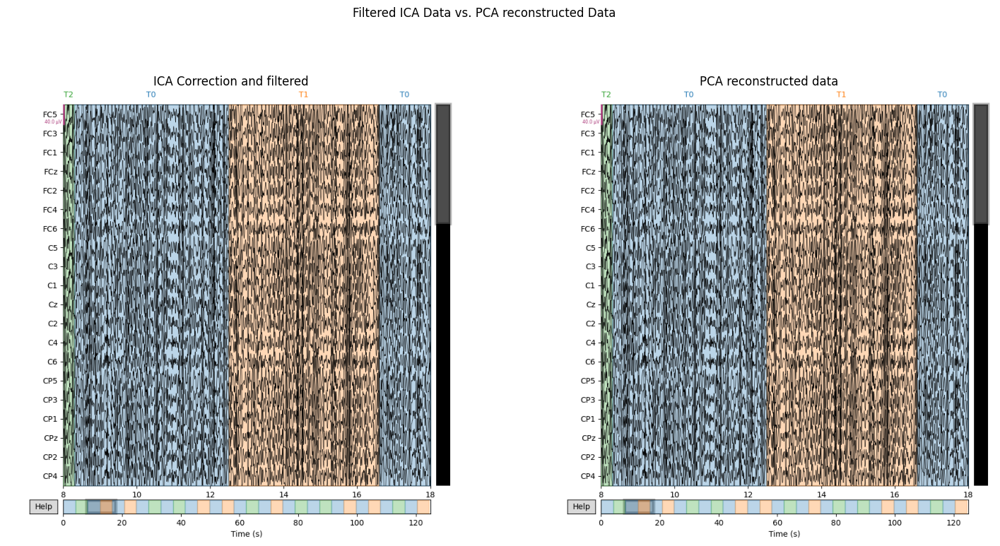

In [30]:
fig, axes = plt.subplots(1, 2, figsize=(18, 9))
fig.suptitle('Filtered ICA Data vs. PCA reconstructed Data')

# Plot the ICA-corrected raw data in the first subplot
filtered_ica_raw_fig = filtered_ica_raw.plot(picks=picks, show=False, start = start, duration = duration)
filtered_ica_raw_fig.canvas.draw()
axes[0].imshow(filtered_ica_raw_fig.canvas.buffer_rgba())
axes[0].set_title('ICA Correction and filtered')
axes[0].axis('off')
plt.close(filtered_ica_raw_fig)

# Plot the reconstructed PCA data in the second subplot
reconstructed_raw_fig = reconstructed_raw.plot(picks=picks, show=False, start = start, duration = duration)
reconstructed_raw_fig.canvas.draw()
axes[1].imshow(filtered_ica_raw_fig.canvas.buffer_rgba())
axes[1].set_title('PCA reconstructed data')
axes[1].axis('off')
plt.close(reconstructed_raw_fig)

plt.show();

##PCA own implementation

In [31]:
#Standardization
data = filtered_ica_raw.get_data()
scaler = StandardScaler()
data_standardized = scaler.fit_transform(data.T).T

In [32]:
#Covariance Matrix Computation
covariance_matrix = np.cov(data_standardized)

#Eigenvalue and Eigenvector Decomposition
eigenvalues, eigenvectors = np.linalg.eig(covariance_matrix)

#avoidng complex domain parts of eigenvalues
eigenvalues = np.real(eigenvalues)
eigenvectors = np.real(eigenvectors)

#Feature Vector Formation
# Sort eigenvalues and their corresponding eigenvectors
idx = np.argsort(eigenvalues)[::-1]
eigenvalues = eigenvalues[idx]
eigenvectors = eigenvectors[:, idx]

   Number of Components  Cumulative Explained Variance (%)
0                     1                          70.358844
1                     2                          78.866061
2                     3                          85.624527
3                     4                          88.649892
4                     5                          90.856030
5                     6                          92.815496
6                     7                          94.389710
7                     8                          95.799072
8                     9                          96.714940
9                    10                          97.526179




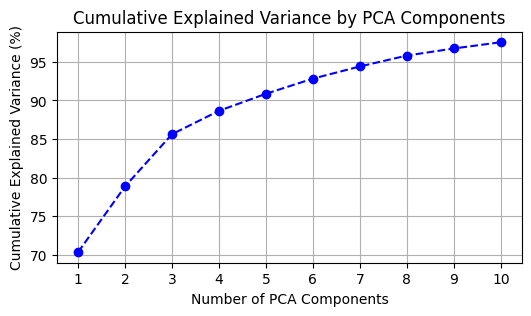

In [33]:
# Calculate the cumulative explained variance
explained_variance_ratio = np.cumsum(eigenvalues) / np.sum(eigenvalues) * 100

# Create a DataFrame with the number of components and cumulative variance
df_explained_variance = pd.DataFrame({
    'Number of Components': range(1, len(eigenvalues) + 1),
    'Cumulative Explained Variance (%)': explained_variance_ratio
})

# Display the DataFrame 10 first rows
print(f"{df_explained_variance.head(10)}\n\n")

# Select the top k eigenvectors
k = 10  # Number of principal components to keep
eigenvectors_reduced = eigenvectors[:, :k]

# Recast the Data
data_pca = np.dot(eigenvectors_reduced.T, data_standardized)

# Visualize the cumulative explained variance
plt.figure(figsize=(6, 3))
plt.plot(range(1, k + 1), explained_variance_ratio[:k], marker='o', linestyle='--', color='b')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of PCA Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.xticks(range(1, k + 1))
plt.grid()
plt.show()

###means of the original channels vs means of own PCA reconstructed channels using n_component

In [34]:
# Reconstruct the data using the reduced principal components
data_reconstructed = np.dot(eigenvectors_reduced, data_pca)
data_reconstructed = scaler.inverse_transform(data_reconstructed.T).T

# Verify if the reconstructed data differs from the original
differences = data - data_reconstructed
mean_difference = np.mean(np.abs(differences))

print(f"Mean absolute difference between original and reconstructed data: {mean_difference} µV")
# Calculate mean and standard deviation of original and reconstructed data
mean_original = np.mean(data, axis=1)
mean_reconstructed = np.mean(data_reconstructed, axis=1)

# Calculate summary statistics
mean_of_means_original = np.mean(mean_original)
mean_of_means_reconstructed = np.mean(mean_reconstructed)

print(f"Mean of means (original data): {mean_of_means_original} µV")

print(f"Mean of means (reconstructed data): {mean_of_means_reconstructed} µV")

Mean absolute difference between original and reconstructed data: 2.099755161135463e-06 µV
Mean of means (original data): -3.5926104508057717e-10 µV
Mean of means (reconstructed data): -3.5926104508053576e-10 µV


In [35]:
# Create a new raw object from the reconstructed data
reconstructed_info = filtered_ica_raw.info  # Use the same info structure as the original data
own_reconstructed_raw = mne.io.RawArray(data_reconstructed, reconstructed_info)

# Add the original annotations to the new Raw object
annotations = filtered_ica_raw.annotations
own_reconstructed_raw.set_annotations(annotations)

# Plot the original and reconstructed data for comparison
picks = mne.pick_types(reconstructed_info, eeg=True, meg=False)

Creating RawArray with float64 data, n_channels=64, n_times=20000
    Range : 0 ... 19999 =      0.000 ...   124.994 secs
Ready.


###Comparing plots

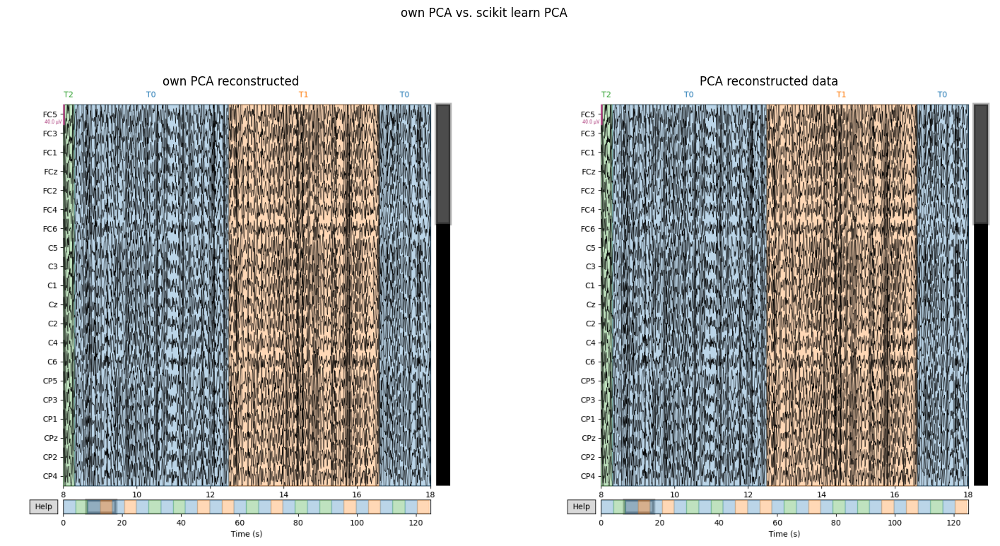

In [36]:
# Plot raw after ICA vs. filtered ICA-corrected data
fig, axes = plt.subplots(1, 2, figsize=(18, 9))
fig.suptitle('own PCA vs. scikit learn PCA')

# Plot the ICA-corrected raw data in the first subplot
own_reconstructed_raw_fig = own_reconstructed_raw.plot(picks=picks, show=False, start = start, duration = duration)
own_reconstructed_raw_fig.canvas.draw()
axes[0].imshow(own_reconstructed_raw_fig.canvas.buffer_rgba())
axes[0].set_title('own PCA reconstructed')
axes[0].axis('off')
plt.close(own_reconstructed_raw_fig)

# Plot the reconstructed PCA data in the second subplot
reconstructed_raw_fig = reconstructed_raw.plot(picks=picks, show=False, start = start, duration = duration)
reconstructed_raw_fig.canvas.draw()
axes[1].imshow(filtered_ica_raw_fig.canvas.buffer_rgba())
axes[1].set_title('PCA reconstructed data')
axes[1].axis('off')
plt.close(reconstructed_raw_fig)

plt.show();